In [48]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.tree import DecisionTreeClassifier 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_score, recall_score, accuracy_score, classification_report, ConfusionMatrixDisplay, confusion_matrix, f1_score, roc_auc_score
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from imblearn.over_sampling import SMOTE
from sklearn.cluster import DBSCAN, KMeans
import seaborn as sns
from scipy.stats import randint
from sklearn.model_selection import RandomizedSearchCV
from sklearn import tree

log_reg = LogisticRegression(max_iter=1000)
from xgboost import XGBClassifier

## Loading data

In [2]:
dataset = pd.read_csv("final project dataset.csv")
dataset

,Id,Income,Age,Experience,Married/Single,House_Ownership,Car_Ownership,Profession,CITY,STATE,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS,Risk_Flag
0,1,1303834,23,3,single,rented,no,Mechanical_engineer,Rewa,Madhya_Pradesh,3,13,0
1,2,7574516,40,10,single,rented,no,Software_Developer,Parbhani,Maharashtra,9,13,0
2,3,3991815,66,4,married,rented,no,Technical_writer,Alappuzha,Kerala,4,10,0
3,4,6256451,41,2,single,rented,yes,Software_Developer,Bhubaneswar,Odisha,2,12,1
4,5,5768871,47,11,single,rented,no,Civil_servant,Tiruchirappalli[10],Tamil_Nadu,3,14,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
251995,251996,8154883,43,13,single,rented,no,Surgeon,Kolkata,West_Bengal,6,11,0
251996,251997,2843572,26,10,single,rented,no,Army_officer,Rewa,Madhya_Pradesh,6,11,0
251997,251998,4522448,46,7,single,rented,no,Design_Engineer,Kalyan-Dombivli,Maharashtra,7,12,0
251998,251999,6507128,45,0,single,rented,no,Graphic_Designer,Pondicherry,Puducherry,0,10,0


In [3]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 252000 entries, 0 to 251999
Data columns (total 13 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   Id                 252000 non-null  int64 
 1   Income             252000 non-null  int64 
 2   Age                252000 non-null  int64 
 3   Experience         252000 non-null  int64 
 4   Married/Single     252000 non-null  object
 5   House_Ownership    252000 non-null  object
 6   Car_Ownership      252000 non-null  object
 7   Profession         252000 non-null  object
 8   CITY               252000 non-null  object
 9   STATE              252000 non-null  object
 10  CURRENT_JOB_YRS    252000 non-null  int64 
 11  CURRENT_HOUSE_YRS  252000 non-null  int64 
 12  Risk_Flag          252000 non-null  int64 
dtypes: int64(7), object(6)
memory usage: 25.0+ MB


In [4]:
dataset.columns

Index(['Id', 'Income', 'Age', 'Experience', 'Married/Single',
       'House_Ownership', 'Car_Ownership', 'Profession', 'CITY', 'STATE',
       'CURRENT_JOB_YRS', 'CURRENT_HOUSE_YRS', 'Risk_Flag'],
      dtype='object')

## Feature Engineering

#### 1.checking null values from the DataFrame

In [5]:
dataset.isnull().sum()
# there is no missing value in the dataset

Id                   0
Income               0
Age                  0
Experience           0
Married/Single       0
House_Ownership      0
Car_Ownership        0
Profession           0
CITY                 0
STATE                0
CURRENT_JOB_YRS      0
CURRENT_HOUSE_YRS    0
Risk_Flag            0
dtype: int64

#### 2. The "Id" is the individual identification for each person and doesn’t have any numeric information. The Id column does not have any value for predicting payment default. So, we can drop the ID column from the data frame.

In [6]:
dataset_1 = dataset.drop(['Id'], axis = 1)
dataset_1 

,Income,Age,Experience,Married/Single,House_Ownership,Car_Ownership,Profession,CITY,STATE,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS,Risk_Flag
0,1303834,23,3,single,rented,no,Mechanical_engineer,Rewa,Madhya_Pradesh,3,13,0
1,7574516,40,10,single,rented,no,Software_Developer,Parbhani,Maharashtra,9,13,0
2,3991815,66,4,married,rented,no,Technical_writer,Alappuzha,Kerala,4,10,0
3,6256451,41,2,single,rented,yes,Software_Developer,Bhubaneswar,Odisha,2,12,1
4,5768871,47,11,single,rented,no,Civil_servant,Tiruchirappalli[10],Tamil_Nadu,3,14,1
...,...,...,...,...,...,...,...,...,...,...,...,...
251995,8154883,43,13,single,rented,no,Surgeon,Kolkata,West_Bengal,6,11,0
251996,2843572,26,10,single,rented,no,Army_officer,Rewa,Madhya_Pradesh,6,11,0
251997,4522448,46,7,single,rented,no,Design_Engineer,Kalyan-Dombivli,Maharashtra,7,12,0
251998,6507128,45,0,single,rented,no,Graphic_Designer,Pondicherry,Puducherry,0,10,0


#### 3.Checking variables'distribution and outliers

In [7]:
summary_stats = dataset_1.describe()
summary_stats

,Income,Age,Experience,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS,Risk_Flag
count,2.520000e+05,252000.000000,252000.000000,252000.000000,252000.000000,252000.000000
mean,4.997117e+06,49.954071,10.084437,6.333877,11.997794,0.123000
std,2.878311e+06,17.063855,6.002590,3.647053,1.399037,0.328438
min,1.031000e+04,21.000000,0.000000,0.000000,10.000000,0.000000
25%,2.503015e+06,35.000000,5.000000,3.000000,11.000000,0.000000
50%,5.000694e+06,50.000000,10.000000,6.000000,12.000000,0.000000
75%,7.477502e+06,65.000000,15.000000,9.000000,13.000000,0.000000
max,9.999938e+06,79.000000,20.000000,14.000000,14.000000,1.000000


In [8]:
from scipy.stats import zscore

#check outlier for Income
z_scores = zscore(dataset_1['Income'])
outliers = dataset_1['Income'][np.abs(z_scores) > 3]
outliers

Series([], Name: Income, dtype: int64)

In [9]:
#check outlier for Age
z_scores = zscore(dataset_1['Age'])
outliers = dataset_1['Age'][np.abs(z_scores) > 3]
outliers

Series([], Name: Age, dtype: int64)

In [10]:
#check outlier for Experience
z_scores = zscore(dataset_1['Experience'])
outliers = dataset_1['Experience'][np.abs(z_scores) > 3]
outliers

Series([], Name: Experience, dtype: int64)

In [11]:
#check outlier for CURRENT_JOB_YRS
z_scores = zscore(dataset_1['CURRENT_JOB_YRS'])
outliers = dataset_1['CURRENT_JOB_YRS'][np.abs(z_scores) > 3]
outliers

Series([], Name: CURRENT_JOB_YRS, dtype: int64)

In [12]:
#check outlier for CURRENT_HOUSE_YRS
z_scores = zscore(dataset_1['CURRENT_HOUSE_YRS'])
outliers = dataset_1['CURRENT_HOUSE_YRS'][np.abs(z_scores) > 3]
outliers

Series([], Name: CURRENT_HOUSE_YRS, dtype: int64)

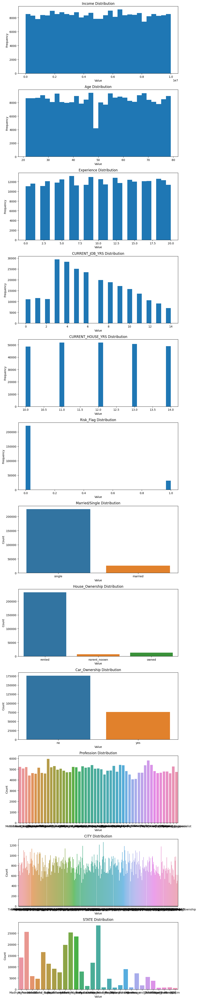

In [13]:
# Check distribution of all variables
num_cols = dataset_1.select_dtypes(include=['float64', 'int64']).columns.tolist()
cat_cols = dataset_1.select_dtypes(include=['object']).columns.tolist()
fig, axs = plt.subplots(nrows=len(num_cols)+len(cat_cols), figsize=(10, 50))
for i, col in enumerate(num_cols):
    axs[i].hist(dataset_1[col], bins=30)
    axs[i].set_title(f'{col} Distribution')
    axs[i].set_xlabel('Value')
    axs[i].set_ylabel('Frequency')
for i, col in enumerate(cat_cols):
    sns.countplot(x=col, data=dataset_1, ax=axs[i+len(num_cols)])
    axs[i+len(num_cols)].set_title(f'{col} Distribution')
    axs[i+len(num_cols)].set_xlabel('Value')
    axs[i+len(num_cols)].set_ylabel('Count')
plt.tight_layout()
plt.show()

In [14]:
#(1)
# most of classes in "city"variable has amount of inout that is less than 1000. 
# It would lead to sparse dataset if converting it into dummy variable, so we drop "CITY" variabl
# and use "STATE" instead.

#(2)
#dealing with “STATE”：
#replace state which has less amount of input（<1400）, replace by "other"
dataset_1['STATE'] = dataset_1['STATE'].replace('Mizoram', 'Other')
dataset_1['STATE'] = dataset_1['STATE'].replace('Manipur', 'Other')
dataset_1['STATE'] = dataset_1['STATE'].replace('Himachal_Pradesh', 'Other')
dataset_1['STATE'] = dataset_1['STATE'].replace('Tripura', 'Other')
dataset_1['STATE'] = dataset_1['STATE'].replace('Uttar_Pradesh[5]', 'Other')
dataset_1['STATE'] = dataset_1['STATE'].replace('Chandigarh', 'Other')
dataset_1['STATE'] = dataset_1['STATE'].replace('Sikkim', 'Other')

value_counts2 = dataset_1['STATE'].value_counts()
value_counts2

Uttar_Pradesh        28400
Maharashtra          25562
Andhra_Pradesh       25297
West_Bengal          23483
Bihar                19780
Tamil_Nadu           16537
Madhya_Pradesh       14122
Karnataka            11855
Gujarat              11408
Rajasthan             9174
Jharkhand             8965
Haryana               7890
Telangana             7524
Assam                 7062
Kerala                5805
Delhi                 5490
Other                 5347
Punjab                4720
Odisha                4658
Chhattisgarh          3834
Uttarakhand           1874
Jammu_and_Kashmir     1780
Puducherry            1433
Name: STATE, dtype: int64

#### 4.scaling for numeric variables

In [15]:
numeric_columns1 = dataset_1.iloc[:,0:3]
numeric_columns2 = dataset_1.iloc[:,9:11]
combined_numeric_columns = pd.concat([numeric_columns1, numeric_columns2], axis=1)


scaler = StandardScaler()
scaled_numeric_columns = scaler.fit_transform(combined_numeric_columns)
scaled_numeric_columns_df = pd.DataFrame(scaled_numeric_columns, columns=combined_numeric_columns.columns)

scaled_numeric_columns_df

,Income,Age,Experience,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS
0,-1.283145,-1.579604,-1.180232,-0.914131,0.716356
1,0.895457,-0.583344,-0.014067,0.731036,0.716356
2,-0.349269,0.940348,-1.013637,-0.639936,-1.427981
3,0.437526,-0.524740,-1.346827,-1.188325,0.001577
4,0.268128,-0.173119,0.152528,-0.914131,1.431135
...,...,...,...,...,...
251995,1.097092,-0.407533,0.485719,-0.091547,-0.713202
251996,-0.748199,-1.403793,-0.014067,-0.091547,-0.713202
251997,-0.164913,-0.231723,-0.513852,0.182647,0.001577
251998,0.524618,-0.290326,-1.680018,-1.736714,-1.427981


In [16]:
#append with categorical columns
categorical_columns = dataset_1.iloc[:,3:9]
categorical_columns = categorical_columns.drop(columns=['CITY'])
categorical_columns

,Married/Single,House_Ownership,Car_Ownership,Profession,STATE
0,single,rented,no,Mechanical_engineer,Madhya_Pradesh
1,single,rented,no,Software_Developer,Maharashtra
2,married,rented,no,Technical_writer,Kerala
3,single,rented,yes,Software_Developer,Odisha
4,single,rented,no,Civil_servant,Tamil_Nadu
...,...,...,...,...,...
251995,single,rented,no,Surgeon,West_Bengal
251996,single,rented,no,Army_officer,Madhya_Pradesh
251997,single,rented,no,Design_Engineer,Maharashtra
251998,single,rented,no,Graphic_Designer,Puducherry


In [17]:
encoded_categorical_columns = pd.get_dummies(categorical_columns)

#concat all columns
data = pd.concat([scaled_numeric_columns_df, encoded_categorical_columns,dataset_1.iloc[:,11]], axis=1)
data

,Income,Age,Experience,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS,Married/Single_married,Married/Single_single,House_Ownership_norent_noown,House_Ownership_owned,House_Ownership_rented,...,STATE_Other,STATE_Puducherry,STATE_Punjab,STATE_Rajasthan,STATE_Tamil_Nadu,STATE_Telangana,STATE_Uttar_Pradesh,STATE_Uttarakhand,STATE_West_Bengal,Risk_Flag
0,-1.283145,-1.579604,-1.180232,-0.914131,0.716356,0,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
1,0.895457,-0.583344,-0.014067,0.731036,0.716356,0,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
2,-0.349269,0.940348,-1.013637,-0.639936,-1.427981,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0.437526,-0.524740,-1.346827,-1.188325,0.001577,0,1,0,0,1,...,0,0,0,0,0,0,0,0,0,1
4,0.268128,-0.173119,0.152528,-0.914131,1.431135,0,1,0,0,1,...,0,0,0,0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
251995,1.097092,-0.407533,0.485719,-0.091547,-0.713202,0,1,0,0,1,...,0,0,0,0,0,0,0,0,1,0
251996,-0.748199,-1.403793,-0.014067,-0.091547,-0.713202,0,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
251997,-0.164913,-0.231723,-0.513852,0.182647,0.001577,0,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
251998,0.524618,-0.290326,-1.680018,-1.736714,-1.427981,0,1,0,0,1,...,0,1,0,0,0,0,0,0,0,0


#### 5. Split the X and Y with train and test

In [18]:
## split the X and Y with train and test
X = data.iloc[:,0:86]
y = data.iloc[:,86]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

## Modeling

#### Define performance metrics

In [21]:
#model evaluation
def metrics(y_test, y_pred):
    
    results = confusion_matrix(y_test, y_pred)
    print ('Confusion Matrix :')
    print(results)
    print("Accuracy: ",accuracy_score(y_test, y_pred))
    print("Precision: ",precision_score(y_test, y_pred))
    print("Recall: ",recall_score(y_test, y_pred))
    print("F1-Score: ",f1_score(y_test, y_pred))
    print("AUC Score: ", roc_auc_score(y_test, y_pred))

#### Logistic Regression

In [49]:
########################################## Logistic Regression - model 1 #############################################

#### Run logistic model using all variables in train data
log_reg_all = sm.Logit(y_train, X_train).fit()
y_pred = log_reg_all.predict(X_test)
# Set probability threshold
threshold = y_pred.mean()

# Make predictions on test set
y_pred_prob = log_reg_all.predict(X_test)
y_pred_class_logis = np.where(y_pred_prob >= threshold, 1, 0)
log_reg_all.summary()

         Current function value: 0.369198
         Iterations: 35


/Users/vicky/miniconda3/envs/vicky/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:              Risk_Flag   No. Observations:               201600
Model:                          Logit   Df Residuals:                   201515
Method:                           MLE   Df Model:                           84
Date:                Thu, 23 Mar 2023   Pseudo R-squ.:                 0.01132
Time:                        14:58:43   Log-Likelihood:                -74430.
converged:                      False   LL-Null:                       -75283.
Covariance Type:            nonrobust   LLR p-value:                2.706e-300
=========================================================================================================
                                            coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
Income                                   -0.0095      0.007     -1.395      0.163      -0.023       0.004
Age                                      -0.0611      0.007     -8.931      0.000      -0.075      -0.048
Experience                               -0.1253      0.009    -13.484      0.000      -0.144      -0.107
CURRENT_JOB_YRS                           0.0306      0.009      3.321      0.001       0.013       0.049
CURRENT_HOUSE_YRS                        -0.0108      0.007     -1.577      0.115      -0.024       0.003
Married/Single_married                   -0.9391   1.94e+05  -4.83e-06      1.000   -3.81e+05    3.81e+05
Married/Single_single                    -0.7151   1.94e+05  -3.68e-06      1.000   -3.81e+05    3.81e+05
House_Ownership_norent_noown             -0.6121        nan        nan        nan         nan         nan
House_Ownership_owned                    -0.7121        nan        nan        nan         nan         nan
House_Ownership_rented                   -0.3300        nan        nan        nan         nan         nan
Car_Ownership_no                         -0.7504   1.58e+05  -4.76e-06      1.000   -3.09e+05    3.09e+05
Car_Ownership_yes                        -0.9038   1.58e+05  -5.73e-06      1.000   -3.09e+05    3.09e+05
Profession_Air_traffic_controller         0.0530        nan        nan        nan         nan         nan
Profession_Analyst                       -0.0389        nan        nan        nan         nan         nan
Profession_Architect                      0.0422        nan        nan        nan         nan         nan
Profession_Army_officer                   0.2158        nan        nan        nan         nan         nan
Profession_Artist                         0.0078        nan        nan        nan         nan         nan
Profession_Aviator                        0.0815        nan        nan        nan         nan         nan
Profession_Biomedical_Engineer           -0.0163        nan        nan        nan         nan         nan
Profession_Chartered_Accountant           0.2392        nan        nan        nan         nan         nan
Profession_Chef                          -0.0599        nan        nan        nan         nan         nan
Profession_Chemical_engineer             -0.1284        nan        nan        nan         nan         nan
Profession_Civil_engineer                 0.0799        nan        nan        nan         nan         nan
Profession_Civil_servant                 -0.0955        nan        nan        nan         nan         nan
Profession_Comedian                      -0.0165        nan        nan        nan         nan         nan
Profession_Computer_hardware_engineer     0.0223        nan        nan        nan         nan         nan
Profession_Computer_operator              0.0265        nan        nan        nan         nan         nan
Profession_Consultant                     0.0224        nan  

In [50]:
#logistic regression model 1 result
metrics(y_test,y_pred_class_logis)

Confusion Matrix :
[[23885 20374]
 [ 2722  3419]]
Accuracy:  0.5417460317460318
Precision:  0.14369772622199806
Recall:  0.5567497150301254
F1-Score:  0.22843589229638536
AUC Score:  0.5482069820547043


In [16]:
########################################## Lasso Logistic Regression - model 2 #############################################
#### Run Lasso logistic model with all variables in train data

import random

random.seed(42)
np.random.seed(42)

# Fit Lasso logistic regression model
clf = LogisticRegression(penalty='l1', solver='liblinear')
clf.fit(X_train, y_train)

# Define feature_names as an array of feature names
feature_names = X_train.columns.values

# Get non-zero coefficients and their corresponding features
non_zero_coef = clf.coef_.ravel() != 0
coef = clf.coef_.ravel()[non_zero_coef]
features = np.array(feature_names)[non_zero_coef]

# Create a DataFrame to display the results
results_df = pd.DataFrame({'Feature': features, 'Coefficient': coef})
print(results_df) 

                Feature  Coefficient
0                Income    -0.009453
1                   Age    -0.061090
2            Experience    -0.125088
3       CURRENT_JOB_YRS     0.030403
4     CURRENT_HOUSE_YRS    -0.010742
..                  ...          ...
78     STATE_Tamil_Nadu    -0.230965
79      STATE_Telangana     0.026236
80  STATE_Uttar_Pradesh    -0.086791
81    STATE_Uttarakhand    -0.773483
82    STATE_West_Bengal    -0.003645

[83 rows x 2 columns]


In [17]:
results_df = results_df.reindex(results_df['Coefficient'].abs().sort_values(ascending=False).index)

# Print the sorted Coefficient of Lasso logistic regression
print(results_df)

                           Feature  Coefficient
7            House_Ownership_owned    -1.643070
6     House_Ownership_norent_noown    -1.541991
8           House_Ownership_rented    -1.262143
81               STATE_Uttarakhand    -0.773483
10               Car_Ownership_yes    -0.499166
..                             ...          ...
17  Profession_Biomedical_Engineer     0.009571
0                           Income    -0.009453
23             Profession_Comedian     0.009378
12              Profession_Analyst    -0.008297
82               STATE_West_Bengal    -0.003645

[83 rows x 2 columns]


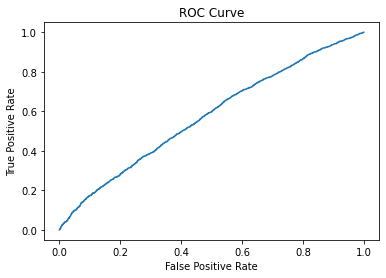

In [18]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Make prediction on test set
y_pred = clf.predict_proba(X_test)[:,1]

# Calculate the false positive rate (FPR), true positive rate (TPR), and thresholds for different threshold values
fpr, tpr, thresholds = roc_curve(y_test, y_pred)

# Plot the ROC curve
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

In [19]:
# Find the threshold value that maximizes the Youden's J statistic (TPR - FPR)
J = tpr - fpr
optimal_idx = np.argmax(J)
optimal_threshold = thresholds[optimal_idx]
print("Optimal threshold:", optimal_threshold)

Optimal threshold: 0.11738083251632178


In [20]:
y_lassopred_class_logis = (y_pred >= optimal_threshold).astype(int)

In [22]:
# Lasso logistic regression model 1 result
metrics(y_test,y_lassopred_class_logis)

Confusion Matrix :
[[20286 23973]
 [ 2137  4004]]
Accuracy:  0.48194444444444445
Precision:  0.14311756085355828
Recall:  0.6520110731151278
F1-Score:  0.23471481329503485
AUC Score:  0.5551792639350465


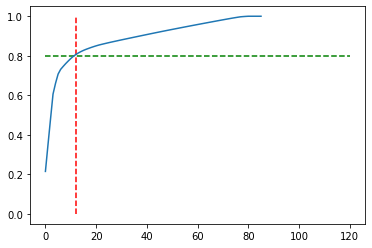

In [41]:
########################################## PCA-Logistic Regression - model 3 #############################################

#### Run PCA- logistic model with all variables in "X_train"

# Decide the number of PCA components based on the retained information

from sklearn.decomposition import IncrementalPCA, PCA
pca = PCA(random_state=88)
pca.fit(X_train)
explained_variance = np.cumsum(pca.explained_variance_ratio_)
plt.vlines(x=12, ymax=1, ymin=0, colors="r", linestyles="--")
plt.hlines(y=0.80, xmax=120, xmin=0, colors="g", linestyles="--")
plt.plot(explained_variance)

We can see above that to retain 80% explained variance (meaning we retain 80% of the information) we need to use 12 PCA components. So we build the PCA model with 12 components.

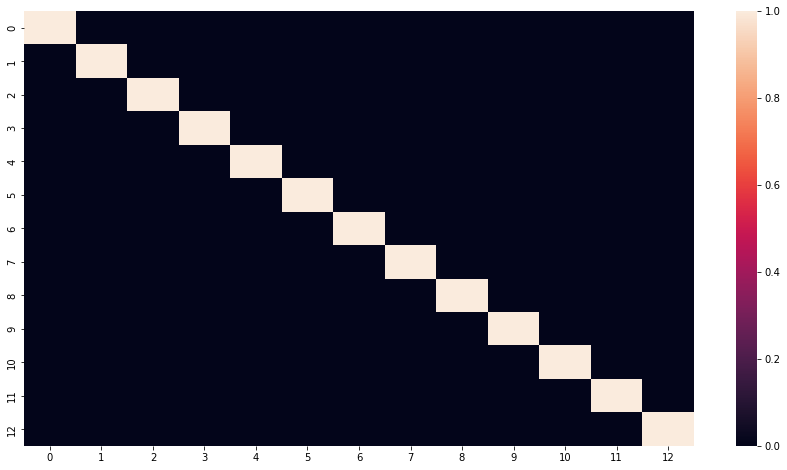

In [42]:
# Train the PCA model 
pca_final = PCA(0.80)
df_train_pca = pca_final.fit_transform(X_train)
 
# Check the correlations between components
corr_mat = np.corrcoef(df_train_pca.transpose())
plt.figure(figsize=[15,8])
sns.heatmap(corr_mat)
plt.show()

As we can see in the heatmap above, all of the correlations are near zero (black). This one of the key features of PCA, i.e. the transformed features are not correlated to one another, i.e. their vectors are orthogonal to each other.

In [43]:
# Apply PCA model to the test data
df_test_pca = pca_final.transform(X_test)
 
# Train the Logistic Regression model
LR_PCA_Learner = LogisticRegression()
LR_PCA_Model = LR_PCA_Learner.fit(df_train_pca, y_train)

# Calculate the predicted probabilities and convert to dataframe
y_pred = LR_PCA_Model.predict_proba(df_test_pca)
y_pred_df = pd.DataFrame(y_pred)
y_pred_1 = y_pred_df.iloc[:,[1]]

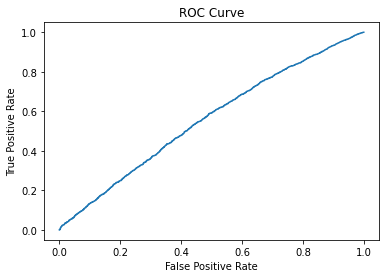

In [44]:
y_pred_1 = y_pred_df.iloc[:,[1]]
# Calculate the false positive rate (FPR), true positive rate (TPR), and thresholds for different threshold values
fpr, tpr, thresholds = roc_curve(y_test, y_pred_1)

# Plot the ROC curve
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()


In [45]:
# Find the threshold value that maximizes the Youden's J statistic (TPR - FPR)
J = tpr - fpr
optimal_idx = np.argmax(J)
optimal_threshold = thresholds[optimal_idx]
print("Optimal threshold:", optimal_threshold)

y_pcapred_class_logis = (y_pred_1 >= optimal_threshold).astype(int)

Optimal threshold: 0.12329517013954655


In [46]:
#PCA - logistic regression model 1 result
metrics(y_test,y_pcapred_class_logis)

Confusion Matrix :
[[22442 21817]
 [ 2520  3621]]
Accuracy:  0.5171230158730159
Precision:  0.14234609639122572
Recall:  0.5896433805569126
F1-Score:  0.22932961778397035
AUC Score:  0.548352045686396


#### k-nearest neighbors

In [28]:
## Create KNN model
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)
y_pred_knn = knn.predict(X_test)

In [29]:
#KNN model result
metrics(y_test, y_pred_knn)

Confusion Matrix :
[[41664  2595]
 [ 2997  3144]]
Accuracy:  0.8890476190476191
Precision:  0.5478306325143754
Recall:  0.5119687347337567
F1-Score:  0.5292929292929293
AUC Score:  0.7266682960593477


#### Decision Tree model

In [28]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred_decision_tree = clf.predict(X_test)

In [29]:
#decision tree model result
metrics(y_test, y_pred_decision_tree)

Confusion Matrix :
[[41164  3095]
 [ 2724  3417]]
Accuracy:  0.8845436507936508
Precision:  0.5247235872235873
Recall:  0.5564240351734245
F1-Score:  0.5401090650438631
AUC Score:  0.7432473776264781


In [30]:
## optimize the decision tree model

# Setup the parameters and distributions to sample from: param_dist
param_dist = {"max_depth": [3, 10],
                "max_features": randint(5, 20),
                "min_samples_leaf": randint(1, 9),
                "criterion": ["gini", "entropy"]}

# Instantiate the RandomizedSearchCV object: clf_cv
clf_cv = RandomizedSearchCV(clf, param_dist, cv=5)

# Fit it to the data
clf_cv.fit(X_train,y_train)

#Predict the response for test dataset
y_pred_decision_tree_cv = clf_cv.predict(X_test)

# Print the tuned parameters and score
print("Tuned Decision Tree Parameters: {}".format(clf_cv.best_params_))
print("Best score is {}".format(clf_cv.best_score_))

Tuned Decision Tree Parameters: {'criterion': 'gini', 'max_depth': 10, 'max_features': 19, 'min_samples_leaf': 7}
Best score is 0.8785714285714284


In [31]:
#decision tree model result
metrics(y_test, y_pred_decision_tree_cv)

Confusion Matrix :
[[44079   180]
 [ 5896   245]]
Accuracy:  0.8794444444444445
Precision:  0.5764705882352941
Recall:  0.039895782445855725
F1-Score:  0.0746268656716418
AUC Score:  0.5179144065079546


In [32]:
# Define feature_names as an array of feature names
feature_names = X_train.columns.values
best_clf = clf_cv.best_estimator_

fig, ax = plt.subplots(figsize=(15, 10), dpi=900)

tree.plot_tree(best_clf,
                   feature_names=feature_names,  
                   class_names=["Not Default", "Default"],
                   filled=True, ax=ax)
    
plt.show()

#### Random Forest model

In [33]:
# Create a random forest classifier
clf = RandomForestClassifier()

# Train the classifier using the data
clf.fit(X_train, y_train)

#Predict the response for test dataset
y_pred_random_forest = clf.predict(X_test)

In [34]:
#random forest model result
metrics(y_test, y_pred_random_forest)

Confusion Matrix :
[[42142  2117]
 [ 2911  3230]]
Accuracy:  0.9002380952380953
Precision:  0.6040770525528334
Recall:  0.5259729685718938
F1-Score:  0.5623259052924792
AUC Score:  0.7390704446104006


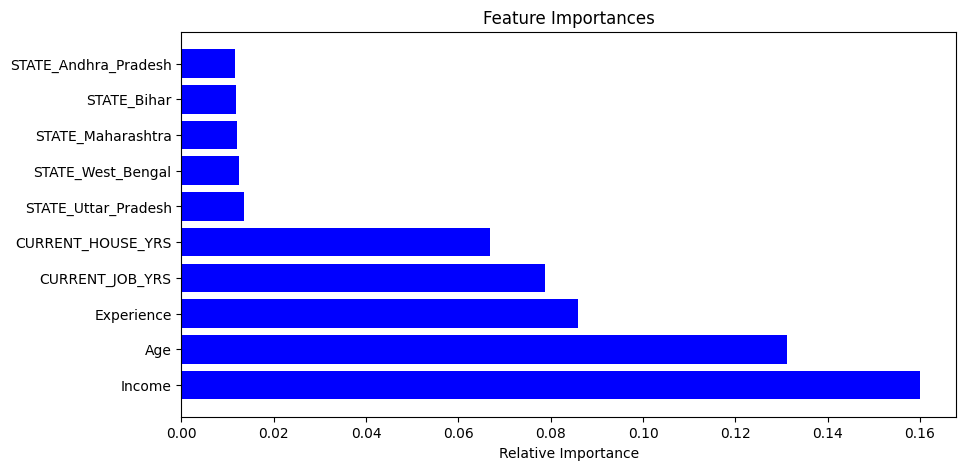

In [35]:
# Define feature_names as an array of feature names
feature_names = X_train.columns.values
importances=clf.feature_importances_
indices = np.argsort(importances)[::-1][:10]

plt.figure(figsize=(10,5))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), feature_names[indices])
plt.xlabel('Relative Importance')
plt.show()

#### XGBoost model

In [36]:
# create model instance
bst = XGBClassifier(objective='binary:logistic')
# fit model
bst.fit(X_train, y_train)
# make predictions
y_pred_xgboost = bst.predict(X_test)

In [37]:
#xgboost model result
metrics(y_test, y_pred_xgboost)

Confusion Matrix :
[[43867   392]
 [ 5350   791]]
Accuracy:  0.8860714285714286
Precision:  0.6686390532544378
Recall:  0.12880638332519134
F1-Score:  0.21600218459858
AUC Score:  0.5599747138388762


## SMOTE Sampling method to solve imbalance problem

In [53]:
## Applying Over Sampling
sm = SMOTE(random_state = 42, sampling_strategy = 1.0)
columns = X_train.columns
X_smote_train, y_smote_train = sm.fit_resample(X_train, y_train)
os_data_X = pd.DataFrame(data=X_smote_train,columns=columns )
os_data_y= pd.DataFrame(data=y_smote_train,columns=['Risk_Flag'])
# we can Check the numbers of our data
print("length of oversampled data is ",len(os_data_X))
print("Number of no subscription in oversampled data",len(os_data_y[os_data_y['Risk_Flag']==0]))
print("Number of subscription",len(os_data_y[os_data_y['Risk_Flag']==1]))
print("Proportion of no subscription data in oversampled data is ",len(os_data_y[os_data_y['Risk_Flag']==0])/len(os_data_X))
print("Proportion of subscription data in oversampled data is ",len(os_data_y[os_data_y['Risk_Flag']==1])/len(os_data_X))

length of oversampled data is  353490
Number of no subscription in oversampled data 176745
Number of subscription 176745
Proportion of no subscription data in oversampled data is  0.5
Proportion of subscription data in oversampled data is  0.5


In [37]:
X_smote_train

,Income,Age,Experience,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS,Married/Single_married,Married/Single_single,House_Ownership_norent_noown,House_Ownership_owned,House_Ownership_rented,...,STATE_Odisha,STATE_Other,STATE_Puducherry,STATE_Punjab,STATE_Rajasthan,STATE_Tamil_Nadu,STATE_Telangana,STATE_Uttar_Pradesh,STATE_Uttarakhand,STATE_West_Bengal
0,-1.124690,-0.993568,-1.680018,-1.736714,-1.427981,0,1,1,0,0,...,0,0,1,0,0,0,0,0,0,0
1,-1.275671,0.940348,-0.347257,0.456842,1.431135,0,1,0,0,1,...,0,0,0,0,0,0,0,1,0,0
2,-0.356451,0.998951,0.985504,1.827814,0.716356,0,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,-0.953691,-0.993568,-0.347257,0.456842,-0.713202,0,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,-0.426103,0.178502,-0.847042,-0.365742,0.001577,0,1,0,0,1,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
353485,0.861087,-1.403793,0.985504,0.182647,0.716356,0,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
353486,1.152398,-1.110775,1.152099,0.456842,1.431135,0,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
353487,0.653436,-0.583344,-0.180662,0.182647,-0.713202,0,1,0,0,1,...,0,0,0,0,0,0,0,1,0,0
353488,0.589816,1.116158,1.152099,1.279425,-0.713202,0,1,1,0,0,...,0,0,0,0,0,0,1,0,0,0


In [38]:
y_smote_train 

0         0
1         1
2         0
3         0
4         0
         ..
353485    1
353486    1
353487    1
353488    1
353489    1
Name: Risk_Flag, Length: 353490, dtype: int64

#### Logistics Regression after sampling

In [51]:
################################# Logistics Regression_model 4 after sampling ############################################
#### Run logistic model with all variable in "X_smote_train"

log_reg_alls = sm.Logit(y_smote_train, X_smote_train).fit()
y_pred_alls = log_reg_alls.predict(X_test)
# Set probability threshold
threshold = y_pred_alls.mean()

# Make predictions on test set
y_pred_alls_prob = log_reg_alls.predict(X_test)
y_pred_alls_class = np.where(y_pred_alls_prob >= threshold, 1, 0)
log_reg_alls.summary()

Optimization terminated successfully.
         Current function value: 0.622934
         Iterations 8


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:              Risk_Flag   No. Observations:               353490
Model:                          Logit   Df Residuals:                   353404
Method:                           MLE   Df Model:                           85
Date:                Thu, 23 Mar 2023   Pseudo R-squ.:                  0.1013
Time:                        14:59:40   Log-Likelihood:            -2.2020e+05
converged:                       True   LL-Null:                   -2.4502e+05
Covariance Type:            nonrobust   LLR p-value:                     0.000
=========================================================================================================
                                            coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
Income                                   -0.0218      0.004     -6.073      0.000      -0.029      -0.015
Age                                      -0.0771      0.004    -21.577      0.000      -0.084      -0.070
Experience                               -0.1356      0.005    -27.875      0.000      -0.145      -0.126
CURRENT_JOB_YRS                           0.0373      0.005      7.745      0.000       0.028       0.047
CURRENT_HOUSE_YRS                        -0.0113      0.004     -3.109      0.002      -0.018      -0.004
Married/Single_married                    2.6495      0.086     30.862      0.000       2.481       2.818
Married/Single_single                     2.9704      0.085     34.884      0.000       2.804       3.137
House_Ownership_norent_noown              1.3446      0.082     16.420      0.000       1.184       1.505
House_Ownership_owned                     1.2154      0.080     15.102      0.000       1.058       1.373
House_Ownership_rented                    1.7355      0.079     22.091      0.000       1.581       1.889
Car_Ownership_no                          3.0541      0.092     33.253      0.000       2.874       3.234
Car_Ownership_yes                         2.8450      0.092     30.946      0.000       2.665       3.025
Profession_Air_traffic_controller        -4.4635      0.060    -74.526      0.000      -4.581      -4.346
Profession_Analyst                       -4.5476      0.061    -75.013      0.000      -4.666      -4.429
Profession_Architect                     -4.4512      0.060    -73.636      0.000      -4.570      -4.333
Profession_Army_officer                  -4.3044      0.060    -71.455      0.000      -4.422      -4.186
Profession_Artist                        -4.5335      0.060    -74.956      0.000      -4.652      -4.415
Profession_Aviator                       -4.4056      0.060    -72.960      0.000      -4.524      -4.287
Profession_Biomedical_Engineer           -4.4807      0.060    -74.619      0.000      -4.598      -4.363
Profession_Chartered_Accountant          -4.2504      0.060    -70.525      0.000      -4.369      -4.132
Profession_Chef                          -4.5678      0.061    -74.936      0.000      -4.687      -4.448
Profession_Chemical_engineer             -4.6637      0.060    -77.250      0.000      -4.782      -4.545
Profession_Civil_engineer                -4.4247      0.061    -73.132      0.000      -4.543      -4.306
Profession_Civil_servant                 -4.6281      0.061    -75.441      0.000      -4.748      -4.508
Profession_Comedian                      -4.4947      0.060    -74.810      0.000      -4.612      -4.377
Profession_Computer_hardware_engineer    -4.4608      0.060    -74.721      0.000      -4.578      -4.344
Profession_Computer_operator             -4.4158      0.060    -73.316      0.000      -4.534      -4.298
Profession_Consultant                    -4.5090      0.060  

In [52]:
metrics(y_test,y_pred_alls_class)

Confusion Matrix :
[[22052 22207]
 [ 2372  3769]]
Accuracy:  0.5123214285714286
Precision:  0.14509547274407145
Recall:  0.6137436899527764
F1-Score:  0.23470436217579477
AUC Score:  0.5559963168352191


In [26]:
############################## Logistic Regression withe lasso after sampling - model 5 #############################################
#### Run Lasso logistic model with all variables in "X_smote_train" data
import random

random.seed(42)
np.random.seed(42)

# Fit Lasso logistic regression model
clf = LogisticRegression(penalty='l1', solver='liblinear',max_iter=10000)
clf.fit(X_smote_train,y_smote_train)




LogisticRegression(max_iter=10000, penalty='l1', solver='liblinear')

In [28]:
# Define feature_names as an array of feature names
feature_names = X_train.columns.values

# Get non-zero coefficients and their corresponding features
non_zero_coef = clf.coef_.ravel() != 0
coef = clf.coef_.ravel()[non_zero_coef]
features = np.array(feature_names)[non_zero_coef]

# Create a DataFrame to display the results
results_df = pd.DataFrame({'Feature': features, 'Coefficient': coef})


results_df = results_df.reindex(results_df['Coefficient'].abs().sort_values(ascending=False).index)

# Print the sorted Coefficient
print(results_df)

                             Feature  Coefficient
61  Profession_Technology_specialist    -6.633714
48     Profession_Petroleum_Engineer    -6.629443
84                 STATE_Uttarakhand    -6.567995
32              Profession_Economist    -6.490904
41    Profession_Industrial_Engineer    -6.420766
..                               ...          ...
2                         Experience    -0.136136
1                                Age    -0.077893
3                    CURRENT_JOB_YRS     0.035737
0                             Income    -0.022556
4                  CURRENT_HOUSE_YRS    -0.011482

[86 rows x 2 columns]


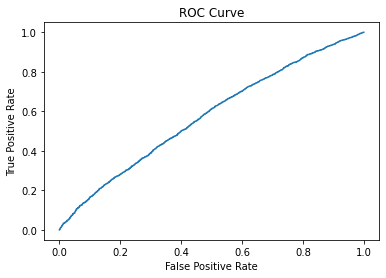

In [34]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt


y_pred_lasso_s = clf.predict_proba(X_test)[:,1]

# Calculate the false positive rate (FPR), true positive rate (TPR), and thresholds for different threshold values
fpr, tpr, thresholds = roc_curve(y_test, y_pred_lasso_s)

# Plot the ROC curve
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

In [35]:
# Find the threshold value that maximizes the Youden's J statistic (TPR - FPR)
J = tpr - fpr
optimal_idx = np.argmax(J)
optimal_threshold = thresholds[optimal_idx]
print("Optimal threshold:", optimal_threshold)

Optimal threshold: 0.43721316171546154


In [37]:
y_lassopred_s_logis = (y_pred_lasso_s >= optimal_threshold).astype(int)
#logistic regression model 1 result
metrics(y_test,y_lassopred_s_logis)

Confusion Matrix :
[[21559 22700]
 [ 2288  3853]]
Accuracy:  0.5042063492063492
Precision:  0.1451060143863217
Recall:  0.6274222439342126
F1-Score:  0.23570074019697804
AUC Score:  0.5572661051343717


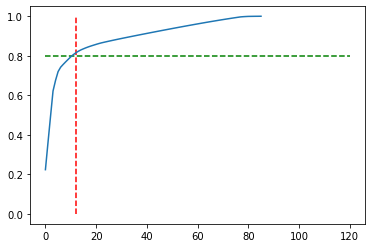

In [246]:
############################### Logistic Regression with pca after sampling - model 6  #############################################

#### Run PCA- logistic model with all variables in "X_smote_train"
# Decide the number of PCA components based on the retained information

from sklearn.decomposition import IncrementalPCA, PCA
pca = PCA(random_state=88)
pca.fit(X_smote_train)
explained_variance = np.cumsum(pca.explained_variance_ratio_)
plt.vlines(x=12, ymax=1, ymin=0, colors="r", linestyles="--")
plt.hlines(y=0.80, xmax=120, xmin=0, colors="g", linestyles="--")
plt.plot(explained_variance)

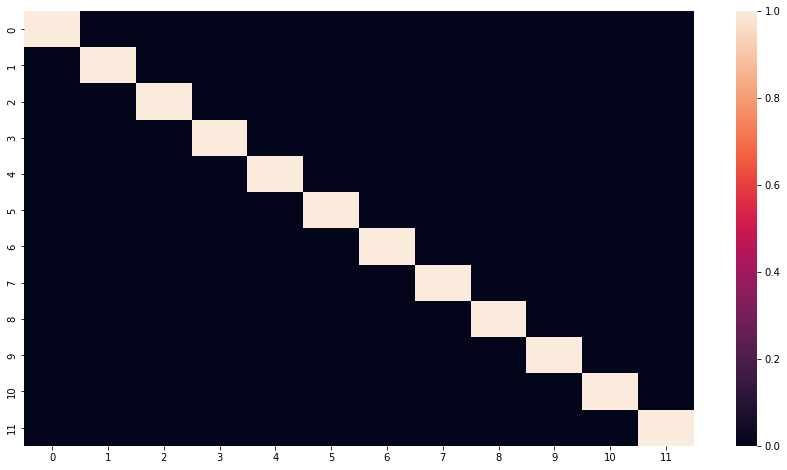

In [250]:
# Train the PCA model 
#pca_final = IncrementalPCA(n_components=60)
#df_train_pca = pca_final.fit_transform(X_train)
 
# Note that the above can be automated like this: (without using plot)
pca_final_s = PCA(0.80)
df_train_pca_s = pca_final_s.fit_transform(X_smote_train)
 
# Check the correlations between components
corr_mat_s = np.corrcoef(df_train_pca_s.transpose())
plt.figure(figsize=[15,8])
sns.heatmap(corr_mat_s)
plt.show()

In [251]:
# Apply PCA model to the test data
df_test_pca_s = pca_final_s.transform(X_test)
 
# Train the Logistic Regression model
LR_PCA_Learner = LogisticRegression()
LR_PCA_Model = LR_PCA_Learner.fit(df_train_pca_s, y_smote_train)

# Calculate the predicted probabilities and convert to dataframe
y_pred_s = LR_PCA_Model.predict_proba(df_test_pca_s)
y_pred_df_s = pd.DataFrame(y_pred_s)
y_pred_1_s = y_pred_df_s.iloc[:,[1]]
y_test_df = pd.DataFrame(y_test)

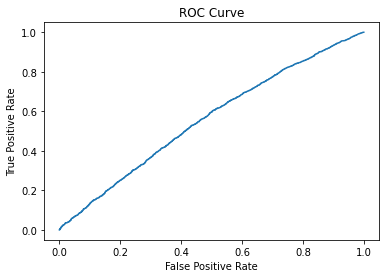

In [253]:
y_pred_1_s = y_pred_df_s.iloc[:,[1]]
# Calculate the false positive rate (FPR), true positive rate (TPR), and thresholds for different threshold values
fpr, tpr, thresholds = roc_curve(y_test, y_pred_1_s)

# Plot the ROC curve
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

In [254]:
# Find the threshold value that maximizes the Youden's J statistic (TPR - FPR)
J = tpr - fpr
optimal_idx = np.argmax(J)
optimal_threshold = thresholds[optimal_idx]
print("Optimal threshold:", optimal_threshold)

y_pcapred_s_logis = (y_pred_1_s >= optimal_threshold).astype(int)

Optimal threshold: 0.49912494539014907


In [255]:
#PCA - logistic regression model 1 result
metrics(y_test,y_pcapred_s_logis)

Confusion Matrix :
[[21961 22298]
 [ 2433  3708]]
Accuracy:  0.5093055555555556
Precision:  0.14258248096593093
Recall:  0.6038104543234001
F1-Score:  0.230690266587862
AUC Score:  0.550001659525739


#### k-nearest neighbors after sampling

In [51]:
knn_smote = KNeighborsClassifier(n_neighbors=5)
knn_smote.fit(X_smote_train, y_smote_train)
y_pred_knn_smote = knn_smote.predict(X_test)

In [52]:
metrics(y_test, y_pred_knn_smote)

Confusion Matrix :
[[37380  6879]
 [ 1913  4228]]
Accuracy:  0.8255555555555556
Precision:  0.3806608445124696
Recall:  0.6884872170656245
F1-Score:  0.49025974025974034
AUC Score:  0.7665306010089188


#### Decision Tree after sampling

In [39]:
# Create Decision Tree classifer object
clf_smote = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf_smote = clf_smote.fit(X_smote_train,y_smote_train)

#Predict the response for test dataset
y_pred_decision_tree_smote = clf_smote.predict(X_test)

In [40]:
#decision tree model result
metrics(y_test, y_pred_decision_tree_smote)

Confusion Matrix :
[[38769  5490]
 [ 1055  5086]]
Accuracy:  0.8701388888888889
Precision:  0.4809001512859304
Recall:  0.8282038755902947
F1-Score:  0.6084823832027277
AUC Score:  0.852080653988464


In [41]:
## optimize the decision tree model

# Setup the parameters and distributions to sample from: param_dist
param_dist_smote = {"max_depth": [3, 10],
                "max_features": randint(5, 20),
                "min_samples_leaf": randint(1, 9),
                "criterion": ["gini", "entropy"]}

# Instantiate the RandomizedSearchCV object: clf_cv
clf_cv_smote = RandomizedSearchCV(clf_smote, param_dist_smote, cv=5)

# Fit it to the data
clf_cv_smote.fit(X_smote_train,y_smote_train)

#Predict the response for test dataset
y_pred_decision_tree_smote = clf_cv_smote.predict(X_test)

# Print the tuned parameters and score
print("Tuned Decision Tree Parameters: {}".format(clf_cv_smote.best_params_))
print("Best score is {}".format(clf_cv_smote.best_score_))

Tuned Decision Tree Parameters: {'criterion': 'gini', 'max_depth': 10, 'max_features': 13, 'min_samples_leaf': 6}
Best score is 0.5700613878751875


In [42]:
#decision tree model result
metrics(y_test, y_pred_decision_tree_smote)

Confusion Matrix :
[[18323 25936]
 [ 1851  4290]]
Accuracy:  0.4486706349206349
Precision:  0.1419307880632568
Recall:  0.6985832926233513
F1-Score:  0.23592817664366045
AUC Score:  0.5562890931586446


In [43]:
# Define feature_names as an array of feature names
feature_names = X_train.columns.values
best_clf = clf_cv_smote.best_estimator_

fig, ax = plt.subplots(figsize=(15, 10), dpi=900)

tree.plot_tree(best_clf,
                   feature_names=feature_names,  
                   class_names=["Not Default", "Default"],
                   filled=True, ax=ax)
    
plt.show()

#### Random Forest after sampling

In [44]:
# Create a random forest classifier
rf_smote = RandomForestClassifier()

# Train the classifier using the data
rf_smote.fit(X_smote_train, y_smote_train)

#Predict the response for test dataset
y_pred_random_forest_smote = rf_smote.predict(X_test)

In [45]:
#random forest model result
metrics(y_test, y_pred_random_forest_smote)

Confusion Matrix :
[[39929  4330]
 [ 1335  4806]]
Accuracy:  0.8875992063492063
Precision:  0.5260507880910683
Recall:  0.782608695652174
F1-Score:  0.6291811219480263
AUC Score:  0.8423877432936755


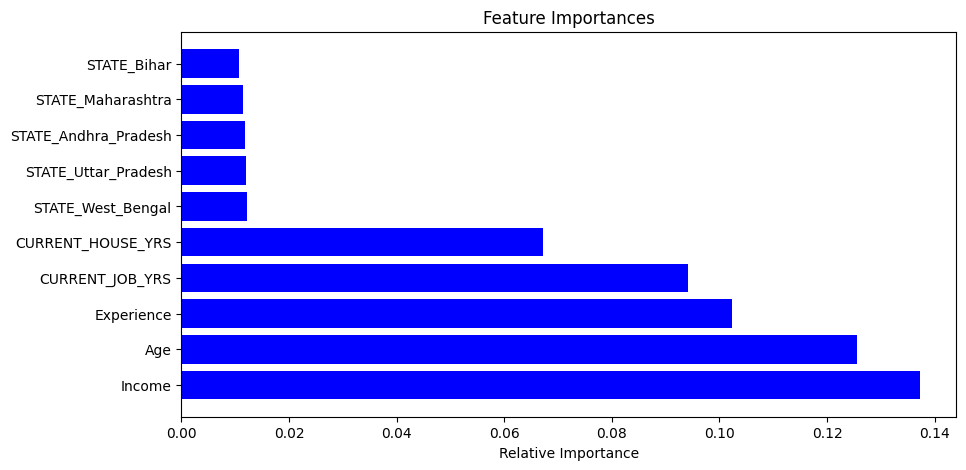

In [46]:
# Define feature_names as an array of feature names
feature_names = X_train.columns.values
importances=rf_smote.feature_importances_
indices = np.argsort(importances)[::-1][:10]

plt.figure(figsize=(10,5))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), feature_names[indices])
plt.xlabel('Relative Importance')
plt.show()

#### XGBoost after sampling

In [59]:
# create model instance
bst_smote = XGBClassifier(objective='binary:logistic')
# fit model
bst_smote.fit(X_smote_train, y_smote_train)
# make predictions
y_pred_xgboost_smote = bst_smote.predict(X_test)

In [60]:
#xgboost model result
metrics(y_test, y_pred_xgboost_smote)

Confusion Matrix :
[[37985  6274]
 [ 1444  4697]]
Accuracy:  0.8468650793650794
Precision:  0.4281287029441254
Recall:  0.7648591434619769
F1-Score:  0.548971482000935
AUC Score:  0.8115513322768663
